# Task 1_Tiền xử lý ảnh đầu vào bằng Median Blur + CLAHE

- **Mục tiêu:** Task 1 dùng **Median Blur** và **Dynamic CLAHE** để giảm nhiễu và cân bằng tương phản ảnh đầu vào, chuẩn bị cho Task 2 (HSV Segmentation)
- **Input / Output:**
    - Input: Ảnh màu BGR gốc từ dataset
    - Output: Ảnh đã được làm mờ nhẹ và cân bằng tương phản
- **Quy trình thực hiện:**
    1. Median Filter(kernel 3×3): Khảo sát các kích thước kernel (3×3, 5×5, 7×7) để chọn kernel phù hợp.
    2. Dynamic CLAHE: Thay vì dùng `clipLimit` cố định, `clipLimit` được **tự động suy ra** theo độ lệch chuẩn (std) của kênh độ sáng L (không gian màu LAB) của từng ảnh:
        - std < 50 (tương phản thấp) -> clipLimit = 4.0
        - 50 <= std < 100 (tương phản trung bình) -> clipLimit = 2.0
        - std >= 100 (tương phản cao) -> clipLimit = 1.0

        `tileGridSize = (8, 8)` Phương pháp này giúp tăng tương phản mạnh hơn cho ảnh mờ/tối, đồng thời tránh khuếch đại nhiễu trên ảnh vốn đã tương phản cao (như ảnh có vùng trời/mặt đường overexposed), hạn chế mà CLAHE với `clipLimit` cố định thường gặp.

       *Phương pháp CLAHE động được xây dựng dựa trên nghiên cứu của Vieira, L. (2024), "Comparing Performance of Preprocessing Techniques for Traffic Sign Recognition Using a HOG-SVM", mục 3.5 Preprocessing Technical Procedure.*



# 1. Import thư viện

In [1]:
import cv2
import pandas as pd
import numpy as np
import yaml
import sys
import pandas as pd
import random
import json
from pathlib import Path
import matplotlib.pyplot as plt

# 2. Thiết lập đường dẫn và đọc config.yaml

In [2]:
CURRENT_DIR = Path.cwd()
PROJECT_ROOT = CURRENT_DIR.parent if CURRENT_DIR.name == "notebooks" else CURRENT_DIR
sys.path.append(str(PROJECT_ROOT))

from src.data_loader import load_config, get_image_dirs

CFG, PROJECT_ROOT, CONFIG_PATH = load_config(PROJECT_ROOT)
IMAGE_DIR, LABEL_DIR = get_image_dirs(CFG, PROJECT_ROOT)

OUTPUT_DIR = PROJECT_ROOT / CFG["paths"]["outputs"]
FIGURE_DIR = OUTPUT_DIR / "figures" / "task1"
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

print("IMAGE_DIR:", IMAGE_DIR)
print("LABEL_DIR:", LABEL_DIR)

IMAGE_DIR: c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\raw\images
LABEL_DIR: c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\raw\labels


# 3. Khảo sát và áp dụng Median Blur

**Median Filter** là phép lock phi tuyên stinhs, bảo toàn được cạnh tôt hơn Gaussian, nó không làm mờ đều biên đỏ/trắng biển báo, điều mà  quan trọng cho phần Segmentation và Cany phía sau. Hơn hết, phương pháp  Median xử lý nhiễu dạng xung (nhiễu cảm biến, nén ảnh) hiệu quả hơn, vì thay pixel bằng giá trị trung vị lân cận thay vì làm mờ trung bình như Gaussian.

In [3]:
from src.data_loader import list_image_paths
from src.utils import show_images


In [4]:
# Lấy nẫu nhiên 5 ảnh để kiểm tra
random.seed(42)
sample_paths  = random.sample(list_image_paths(IMAGE_DIR), 5)
sample_images = [cv2.imread(str(p)) for p in sample_paths]
sample_titles = [p.name for p in sample_paths]

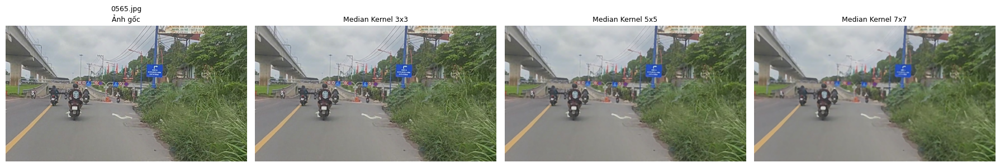

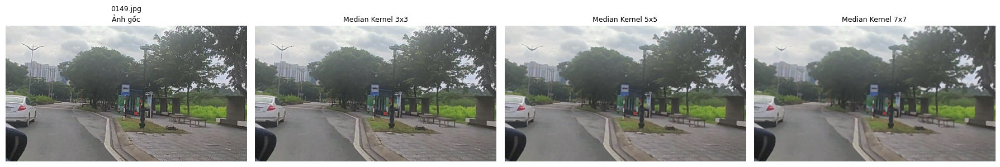

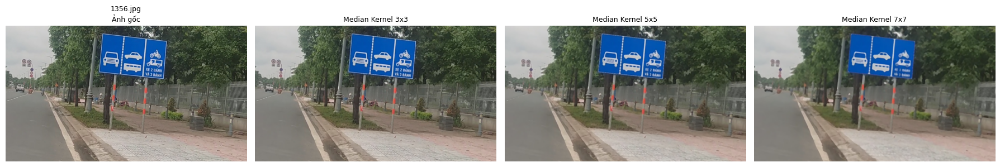

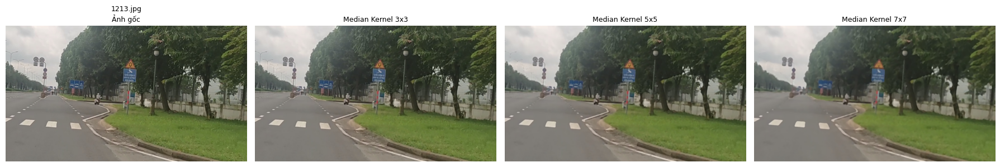

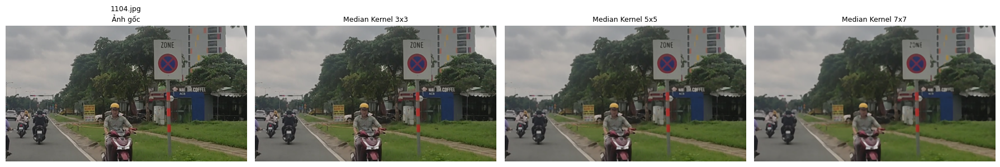

In [5]:
# Khảo sát ở 3 mức kernel
selected_kernels = [3, 5, 7]

for img, title in zip(sample_images, sample_titles):
    results = [img]
    titles = [f"{title}\nẢnh gốc"]
    
    for k in selected_kernels:
        denoised = cv2.medianBlur(img, k)
        results.append(denoised)
        titles.append(f"Median Kernel {k}x{k}")
    
    show_images(results, titles, figsize=(18, 4))

**Nhận xét:**
- Kernel **3×3**: Gần như giữ nguyên chi tiết ảnh gốc, chỉ khử nhiễu nhẹ (nhiễu hạt/nhiễu cảm biến), viền biển báo và chữ vẫn sắc nét nhất trong 3 lựa chọn.
- Kernel **5×5**: Mờ vừa phải, vẫn giữ được viền biển báo tương đối rõ, nhưng cũng đã bắt đầu làm mịn texture nền (cây cối, gạch...).
- Kernel **7×7**: Giảm nhiễu rất mạnh nhưng viền biển báo, chữ trên biển quảng cáo, và các chi tiết nhỏ (dây điện, người đi xe máy ở xa) bị nhòe rõ rệt.
-> Chọn **kernel = 3** cho Median Filter trong Task 1.

In [6]:
selected_kernel = 3

# 5. CLAHE

## 5.1. Lấy 3 ảnh có độ tương phản sáng/tối/trung bình

In [7]:
# Tính độ lệch chuẩn (std) của kênh L (LAB) cho từng ảnh
# đây là đại lượng Dynamic CLAHE dùng để tự chọn clipLimit
def image_contrast_std(path):
    img = cv2.imread(str(path))
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, _, _ = cv2.split(lab)
    return float(np.std(l))

all_paths = list_image_paths(IMAGE_DIR)
df = pd.DataFrame([
    {"path": p, "name": p.name, "contrast_std": image_contrast_std(p)}
    for p in all_paths
])

In [8]:
# Chia toàn bộ ảnh vào 3 nhóm theo đúng ngưỡng mà Dynamic CLAHE dùng để rẽ nhánh clipLimit
low_bucket  = df[df["contrast_std"] < 50]
mid_bucket  = df[(df["contrast_std"] >= 50) & (df["contrast_std"] < 100)]
high_bucket = df[df["contrast_std"] >= 100]

In [9]:
# Với mỗi nhóm, chọn ảnh có std gần trung vị nhất (đại diện điển hình, tránh ảnh cực đoan ở rìa nhóm)
def pick_typical(bucket, fallback_df, ascending):
    if len(bucket) > 0:
        med = bucket["contrast_std"].median()
        return bucket.iloc[(bucket["contrast_std"] - med).abs().argsort().iloc[0]]
    return fallback_df.sort_values("contrast_std", ascending=ascending).iloc[0]

print(f"Số ảnh trong từng nhóm: THẤP={len(low_bucket)} | TRUNG BÌNH={len(mid_bucket)} | CAO={len(high_bucket)}")

Số ảnh trong từng nhóm: THẤP=866 | TRUNG BÌNH=1666 | CAO=0


**Nhận xét:** Dataset không có ảnh nào đạt độ tương phản đủ cao để rơi vào nhánh `clipLimit=1.0`. Vì vậy phần minh họa chỉ còn 2 ảnh đại diện (THẤP, TRUNG BÌNH) thay vì 3. Tuy nhiên nhánh `clipLimit=1.0` không có ảnh thật để minh họa, nhưng logic `compute_dynamic_clip_limit()` vẫn xử lý đúng nếu gặp ảnh std>=100 khi chạy trên ảnh mới (inference) sau này.

In [10]:
selected = [
    ("Ảnh tương phản THẤP ",            pick_typical(low_bucket,  df, True)),
    ("Ảnh tương phản TRUNG BÌNH", pick_typical(mid_bucket,  df, True)),
]

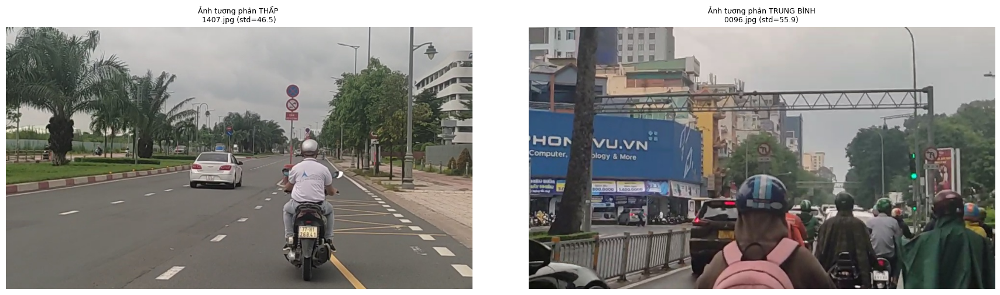

In [11]:
# Gom lại thành 2 ảnh mẫu đại diện + hiển thị trực quan
sample_labels = [lbl for lbl, _ in selected]
survey_paths  = [row["path"] for _, row in selected]
survey_images = [cv2.imread(str(p)) for p in survey_paths]
survey_titles = [f"{lbl}\n{p.name} (std={row['contrast_std']:.1f})"
                 for (lbl, row), p in zip(selected, survey_paths)]

show_images(survey_images, survey_titles, figsize=(18, 5))

## 5.2. Định nghĩa hàm CLAHE

Ảnh tương phản THẤP                      | std kênh L =  45.78  ->  clipLimit = 4.0


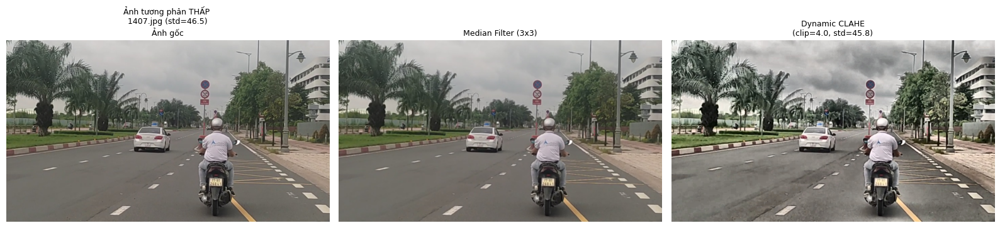

Ảnh tương phản TRUNG BÌNH                | std kênh L =  55.40  ->  clipLimit = 2.0


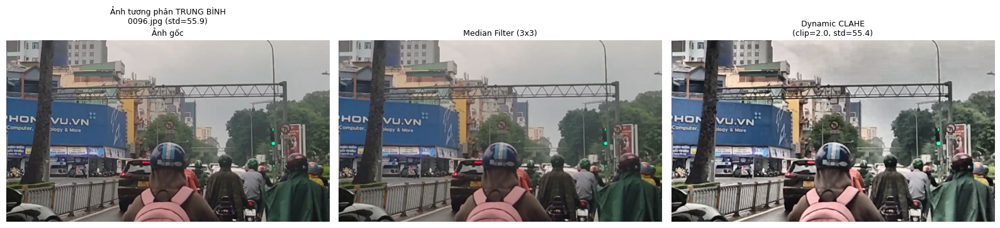

In [12]:
from src.preprocessing import apply_clahe_lab, apply_median_filter
from src.utils import show_images
for img, title, label in zip(survey_images, survey_titles, sample_labels):
    
    # Áp dụng Median Filter
    denoised = apply_median_filter(img, kernel_size=selected_kernel)
    
    # Áp dụng Dynamic CLAHE
    enhanced, clip_used, std_val = apply_clahe_lab(denoised, tile_grid_size=(8, 8))

    # In thông tin
    print(f"{label:<40} | std kênh L = {std_val:6.2f}  ->  clipLimit = {clip_used}")

    # Hiển thị
    show_images(
        [img, denoised, enhanced],
        [
            f"{title}\nẢnh gốc",
            f"Median Filter ({selected_kernel}x{selected_kernel})",
            f"Dynamic CLAHE\n(clip={clip_used}, std={std_val:.1f})"
        ],
        figsize=(16, 5)
    )

# 5.3. Histogram kênh L trước / sau Dynamic CLAHE

In [13]:
# Hàm  tách kênh L (LAB) từ ảnh BGR để vẽ histogram
def get_l_channel(image_bgr):
    lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)
    l, _, _ = cv2.split(lab)
    return l

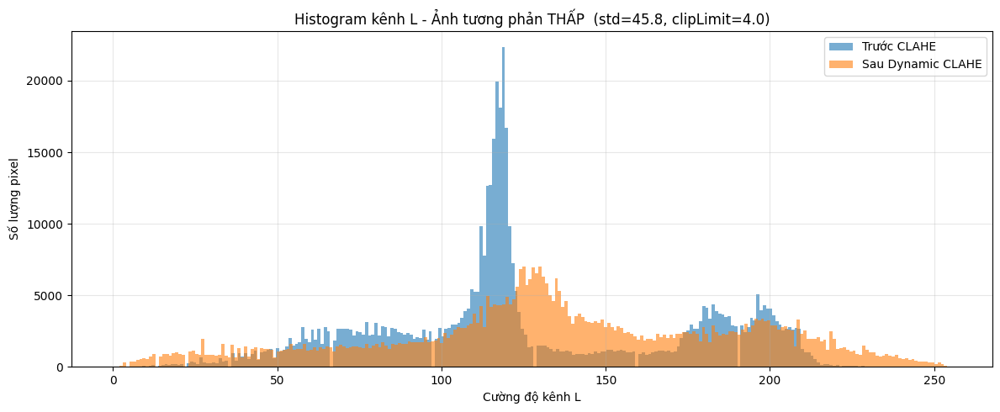

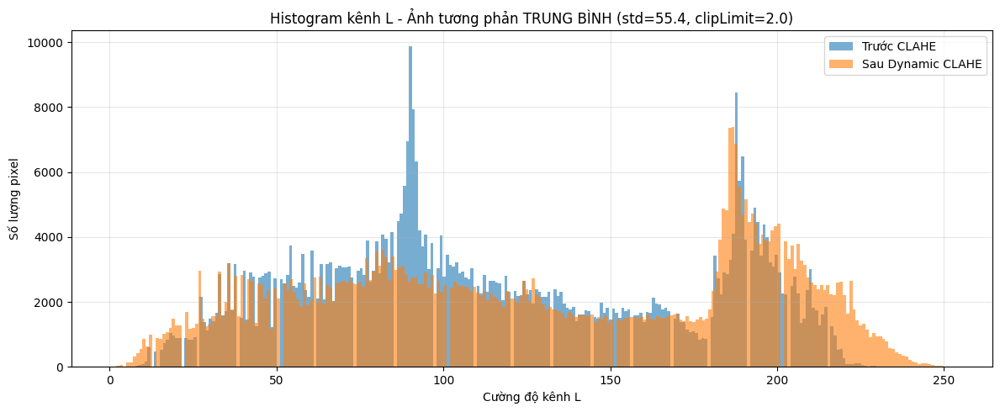

In [14]:
from src.preprocessing import apply_clahe_lab
import matplotlib.pyplot as plt
import cv2

for img, title, label in zip(survey_images, survey_titles, sample_labels):
    
    denoised = cv2.medianBlur(img, selected_kernel)
    enhanced, clip_used, std_val = apply_clahe_lab(denoised, tile_grid_size=(8, 8))

    lab_before = cv2.cvtColor(denoised, cv2.COLOR_BGR2LAB)
    lab_after  = cv2.cvtColor(enhanced, cv2.COLOR_BGR2LAB)

    plt.figure(figsize=(12, 5))
    plt.hist(lab_before[:, :, 0].ravel(), bins=256, alpha=0.6, label="Trước CLAHE")
    plt.hist(lab_after[:, :, 0].ravel(),  bins=256, alpha=0.6, label="Sau Dynamic CLAHE")
    
    plt.title(f"Histogram kênh L - {label} (std={std_val:.1f}, clipLimit={clip_used})")
    plt.xlabel("Cường độ kênh L")
    plt.ylabel("Số lượng pixel")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

**Nhận xét**

- **Ảnh tương phản THẤP:** Trước CLAHE, một đỉnh rất nhọn và cao tại ~110-120 (vùng đồng nhất lớn chiếm ưu thế), dải động hẹp. Sau khi áp dụng Dynamic CLAHE, đỉnh được trải rộng ra 90-150, vùng cường độ thấp (0-90) được nâng mật độ. clipLimit cao phù hợp vì ảnh có tương phản thấp, cần khuếch đại mạnh.

- **Ảnh tương phản TRUNG BÌNH:** Trước CLAHE, hai đỉnh nhọn tại ~90 và ~185 (hai vùng đồng nhất lớn), xen giữa là vùng thưa. Sau CLAHE, cả hai đỉnh được làm phẳng và trải rộng, mức thay đổi tổng thể nhẹ hơn ảnh trên. clipLimit thấp hơn giúp tránh khuếch đại quá mức vùng đã có tương phản tạm ổn.

# 6. Tổng kết lại và lưu vào config

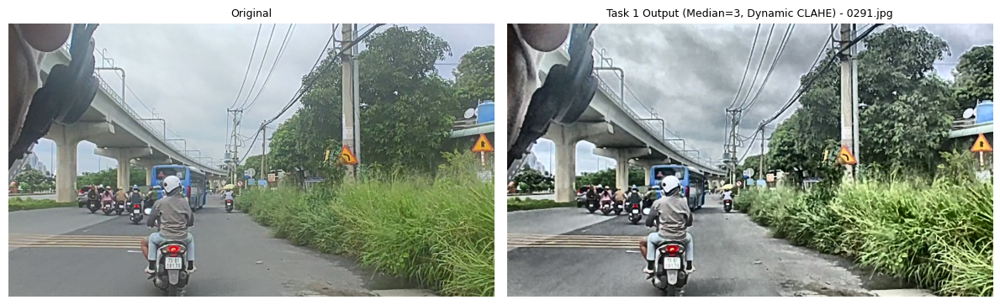

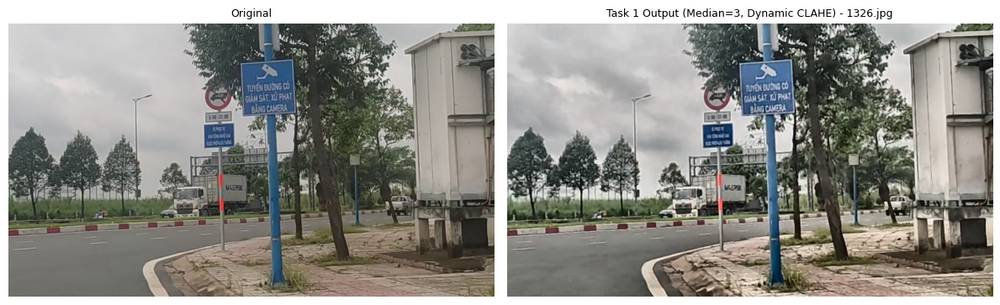

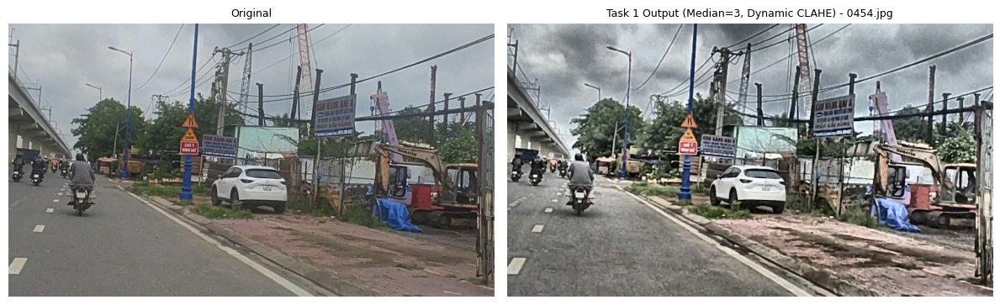

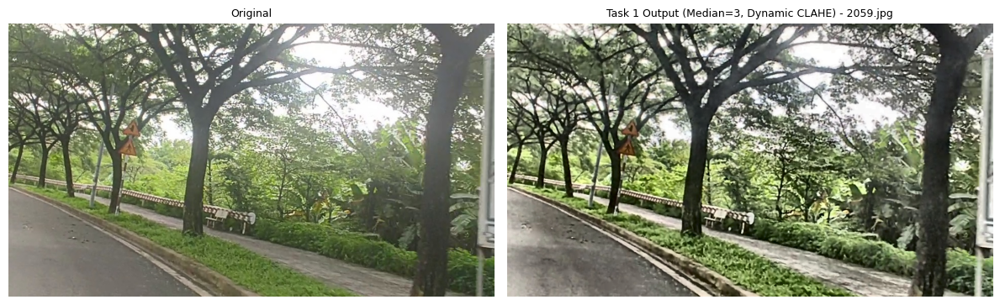

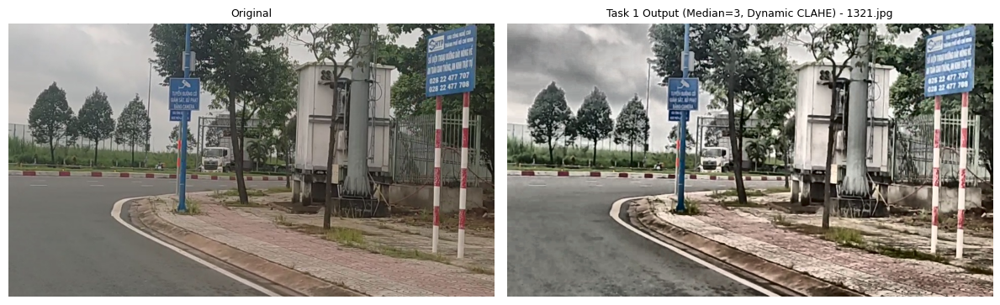

In [15]:
from src.preprocessing import preprocess_task1
from src.utils import show_images

random.seed(123)
random_paths  = random.sample(list_image_paths(IMAGE_DIR), 5)
random_images = [cv2.imread(str(p)) for p in random_paths]
random_titles = [p.name for p in random_paths]

for img, title in zip(random_images, random_titles):
    result = preprocess_task1(img, kernel_size=selected_kernel)
    
    show_images(
        [img, result],
        ["Original", f"Task 1 Output (Median={selected_kernel}, Dynamic CLAHE) - {title}"],
        figsize=(12, 5)
    )

In [16]:
from src.data_loader import save_config

with open(CONFIG_PATH, "r", encoding="utf-8") as f:
    cfg = yaml.safe_load(f)

cfg.setdefault("task1", {})
cfg["task1"]["method"] = "median"
cfg["task1"]["median_kernel"] = 3
cfg["task1"]["clahe_mode"] = "dynamic"
cfg["task1"]["note"] = "Dùng Median Filter + Dynamic CLAHE (thay Gaussian)"

save_config(cfg, CONFIG_PATH)

print("Đã cập nhật config.yaml:")
print(f"  method         = {cfg['task1']['method']}")
print(f"  median_kernel  = {cfg['task1']['median_kernel']}")
print(f"  clahe_mode     = {cfg['task1']['clahe_mode']}")

Đã cập nhật config.yaml:
  method         = median
  median_kernel  = 3
  clahe_mode     = dynamic


In [17]:
# Lây ra 5 ảnh ngẫu nhiên lưu tên vào file JSON để khảo sát xuyên suôyt cho các phần sau
QUALITATIVE_JSON_PATH = PROJECT_ROOT / "data" / "interim" / "qualitative_check_images.json"

if QUALITATIVE_JSON_PATH.exists():
    with open(QUALITATIVE_JSON_PATH, "r", encoding="utf-8") as f:
        qual_names = json.load(f)
    print(f"Đã có sẵn -> tải lại {len(qual_names)} ảnh từ {QUALITATIVE_JSON_PATH}")
else:
    random.seed(7)
    qual_names = [p.name for p in random.sample(list_image_paths(IMAGE_DIR), 5)]
    QUALITATIVE_JSON_PATH.parent.mkdir(parents=True, exist_ok=True)
    with open(QUALITATIVE_JSON_PATH, "w", encoding="utf-8") as f:
        json.dump(qual_names, f, ensure_ascii=False, indent=2)
    print(f"Đã tạo mới {len(qual_names)} ảnh -> {QUALITATIVE_JSON_PATH}")

print(qual_names)

Đã có sẵn -> tải lại 5 ảnh từ c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\interim\qualitative_check_images.json
['1616.jpg', '0750.jpg', '2000.jpg', '0263.jpg', '0386.jpg']


# 7. Xử lý trên toàn bộ dataset và lưu ảnh vào thư mục processed/task_1

In [18]:
from src.data_loader import load_image
from src.preprocessing import preprocess_task1

PROCESSED_IMAGE_DIR = PROJECT_ROOT / "data" / "processed" / "task1_preprocessing" / "images"
PROCESSED_IMAGE_DIR.mkdir(parents=True, exist_ok=True)

all_paths = list_image_paths(IMAGE_DIR)

for path in all_paths:
    img = load_image(path)
    if img is None:
        continue

    result = preprocess_task1(img, kernel_size=3)

    out_path = PROCESSED_IMAGE_DIR / path.name
    cv2.imwrite(str(out_path), result)

print(f"Đã xử lý {len(all_paths)} ảnh -> {PROCESSED_IMAGE_DIR}")

Đã xử lý 2532 ảnh -> c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\processed\task1_preprocessing\images


# 8. Đồng bộ nhãn (labels) sang thư mục output của Task 1

In [19]:
import shutil

PROCESSED_LABEL_DIR = PROJECT_ROOT / "data" / "processed" / "task1_preprocessing"/ "labels"
PROCESSED_LABEL_DIR.mkdir(parents=True, exist_ok=True)

for path in all_paths:
    label_path = LABEL_DIR / f"{path.stem}.txt"
    if label_path.exists():
        shutil.copy(label_path, PROCESSED_LABEL_DIR / label_path.name)